# Gesture Recognition
In this group project, you are going to build a 3D Conv model that will be able to predict the 5 gestures correctly. Please import the following libraries to get started.

In [1]:
!rm -rf "/kaggle/working/"

rm: cannot remove '/kaggle/working/': Device or resource busy


In [2]:
import warnings

# 🔵 Disable warnings
warnings.filterwarnings('ignore')

In [3]:
!pip install --quiet pillow
!pip install --quiet imageio

In [4]:
# Import the popular numerical computing library, which is used for array manipulation
import numpy as np  

# Import os module for interfacing with the operating system (e.g., for file management)
import os

# Import the imageio library to read and write images
import imageio 

# Import the Image class from the Pillow (PIL) library for image processing tasks
from PIL import Image

# Import the datetime module to work with date and time (useful for timestamping)
import datetime

# Import OpenCV (cv2) for complex computer vision tasks and image manipulations
import cv2

We set the random seed so that the results don't vary drastically.

In [5]:
custom_seed = 30

In [6]:
# Set a specific seed for NumPy's random number generator to ensure reproducibility
np.random.seed(custom_seed)

# Import the `random` library and set its seed for generating reproducible random numbers
import random as rn
rn.seed(custom_seed)

# Import the Keras backend module to manipulate low-level TensorFlow details
from keras import backend as K

# Import TensorFlow and set its seed to ensure reproducible results during model training
import tensorflow as tf
tf.random.set_seed(custom_seed)

In this block, you read the folder names for training and validation. You also set the `batch_size` here. Note that you set the batch size in such a way that you are able to use the GPU in full capacity. You keep increasing the batch size until the machine throws an error.

### This project uses the case study dataset uploaded into our kaggle dataset

https://www.kaggle.com/datasets/aravindvcyber/av-ms-gesture-recognition-project

In [7]:
train_doc = np.random.permutation(open('/kaggle/input/av-ms-gesture-recognition-project/Project_data/train.csv').readlines())
val_doc = np.random.permutation(open('/kaggle/input/av-ms-gesture-recognition-project/Project_data/val.csv').readlines())


In [ ]:
batch_size = 40

The gestures are continuously monitored by the webcam mounted on the TV. Each gesture corresponds to a specific command:

Thumbs up:  Increase the volume
Thumbs down: Decrease the volume
Left swipe: 'Jump' backwards 10 seconds
Right swipe: 'Jump' forward 10 seconds  
Stop: Pause the movie
 

Each video is a sequence of 30 frames (or images).

## Sample data inpsection per video sequence

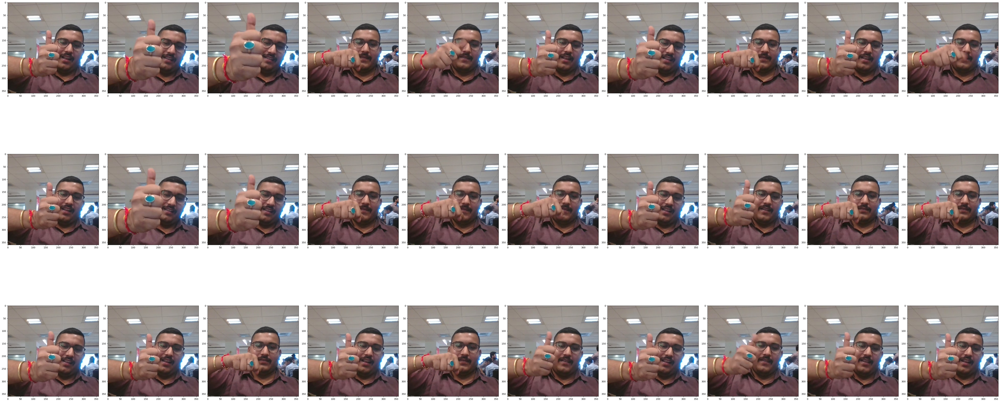

In [8]:
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
import math

images = []
sample_video_sequence_path = '/kaggle/input/av-ms-gesture-recognition-project/Project_data/val/WIN_20180907_15_38_42_Pro_Thumbs Up_new'
for img_path in glob.glob(sample_video_sequence_path + '/*.png'):
    images.append(mpimg.imread(img_path))

plt.figure(figsize=(60,30))
columns = 10
rows = math.ceil(len(images) / columns)  # Use math.ceil to get an integer
for i, image in enumerate(images):
    plt.subplot(rows, columns, i + 1)
    plt.imshow(image)
    
plt.tight_layout()  # This prevents overlapping of plots
plt.show()

These folders are in turn divided into subfolders where each subfolder represents a video of a particular gesture. Each subfolder, i.e. a video, contains 30 frames (or images). Note that all images in a particular video subfolder have the same dimensions but different videos may have different dimensions. Specifically, videos have two types of dimensions - either 360x360 or 120x160 (depending on the webcam used to record the videos). Hence, you will need to do some pre-processing to standardise the videos. 

## Generator
This is one of the most important part of the code. The overall structure of the generator has been given. In the generator, you are going to preprocess the images as you have images of 2 different dimensions as well as create a batch of video frames. You have to experiment with `img_idx`, `y`,`z` and normalization such that you get high accuracy.

### choosing the sequence ids

In [9]:
# choosen sequence ids
# selecting alternate frames from 7 to 26.
seq_idx = range(7,26,2)
 ## all images
# seq_idx = range(0,30,1)


## Generator with necessary preprocessing

In [10]:
def generator(source_path, folder_list, batch_size, is_train=False, augmention=False, debug=False):
    img_idx = seq_idx  # List of image indices for each video you want to use.
    x = len(img_idx)
    y, z = dim_x, dim_y
    
    while True:
        # Data Augmentation and Shuffling for Training
        if is_train and augmention:
            t = np.concatenate((np.random.permutation(folder_list),
                                np.random.permutation(folder_list)))  # Doubles the data when augmentation is applied
        else:
            t = np.random.permutation(folder_list)
        
        # Calculate the number of batches needed
        num_batches = len(t) // batch_size
        leftover_count = len(t) % batch_size
        
        # Full batches
        for batch in range(num_batches):  # Full batches
            batch_data = np.zeros((batch_size, x, y, z, 3))  # (batch_size, seq_len, height, width, channels)
            batch_labels = np.zeros((batch_size, 5))        # One-hot representation of the labels

            for folder in range(batch_size):
                if debug:
                    plt.figure(figsize=(20,5))
                folder_idx = folder + batch * batch_size
                folder_str = t[folder_idx]
                imgs = os.listdir(source_path + '/' + folder_str.split(';')[0])

                # Randomize and select augmentation type
                aug_type = None
                if is_train and augmention and np.random.randint(0, 2) == 1:
                    aug_type = np.random.randint(0, 4)

                for idx, item in enumerate(img_idx):
                    image = cv2.imread(source_path + '/' + folder_str.strip().split(';')[0] + '/' + imgs[item]).astype(np.float32)
                    
                    if debug:
                        plt.subplot(2, x, idx + 1)
                        plt.imshow(image.astype('uint8'))
                        plt.title('Original')

                    # Aspect-ratio-based Cropping (preprocessing)
                    if image.shape[1] > image.shape[0]:
                        diff_px = image.shape[1] - image.shape[0]
                        crop_start = diff_px // 2
                        crop_end = crop_start + image.shape[0]
                        image = image[:, crop_start:crop_end]
                    elif image.shape[0] > image.shape[1]:
                        diff_px = image.shape[0] - image.shape[1]
                        crop_start = diff_px // 2
                        crop_end = crop_start + image.shape[1]
                        image = image[:, crop_start:crop_end]

                    # Resize the image
                    resized_im = cv2.resize(image, (y, z))

                    # Apply Augmentation if needed
                    if aug_type is not None:
                        if aug_type == 0:  # Edge Enhancement
                            resized_im = np.array(Image.fromarray(np.uint8(resized_im), 'RGB').filter(ImageFilter.EDGE_ENHANCE))
                        elif aug_type == 1:  # Gaussian Blur
                            resized_im = np.array(Image.fromarray(np.uint8(resized_im), 'RGB').filter(ImageFilter.GaussianBlur(1)))
                        elif aug_type == 2:  # Detail Enhancement
                            resized_im = np.array(Image.fromarray(np.uint8(resized_im), 'RGB').filter(ImageFilter.DETAIL))
                        elif aug_type == 3:  # Sharpening
                            resized_im = np.array(Image.fromarray(np.uint8(resized_im), 'RGB').filter(ImageFilter.SHARPEN))
                        elif aug_type == 4:  # Brightness Enhancement
                            resized_im = np.array(ImageEnhance.Brightness(Image.fromarray(np.uint8(resized_im), 'RGB')).enhance(1.5))

                    # Debug visualization of augmented image
                    if debug and augmention:
                        plt.subplot(2, x, idx + x + 1)
                        plt.imshow(resized_im)
                        plt.title('Augmented')

                    # Normalization (0-1 scaling)
                    batch_data[folder, idx, :, :, 0] = resized_im[:, :, 0] / 255
                    batch_data[folder, idx, :, :, 1] = resized_im[:, :, 1] / 255
                    batch_data[folder, idx, :, :, 2] = resized_im[:, :, 2] / 255

                # Assign the one-hot encoded label
                batch_labels[folder, int(folder_str.strip().split(';')[2])] = 1

            yield batch_data, batch_labels

        # Handle the leftover data (if dataset length is not divisible by batch_size)
        if leftover_count > 0:
            batch_data = np.zeros((leftover_count, x, y, z, 3))
            batch_labels = np.zeros((leftover_count, 5))

            for folder in range(leftover_count):
                folder_idx = folder + num_batches * batch_size  # Pick from leftovers
                folder_str = t[folder_idx]
                imgs = os.listdir(source_path + '/' + folder_str.split(';')[0])

                # Again check if augmentation is needed for leftover data
                aug_type = None
                if is_train and augmention and np.random.randint(0, 2) == 1:
                    aug_type = np.random.randint(0, 4)

                for idx, item in enumerate(img_idx):
                    image = cv2.imread(source_path + '/' + folder_str.strip().split(';')[0] + '/' + imgs[item]).astype(np.float32)
                    
                    # Aspect-ratio-based Cropping
                    if image.shape[1] > image.shape[0]:
                        diff_px = image.shape[1] - image.shape[0]
                        crop_start = diff_px // 2
                        crop_end = crop_start + image.shape[0]
                        image = image[:, crop_start:crop_end]
                    elif image.shape[0] > image.shape[1]:
                        diff_px = image.shape[0] - image.shape[1]
                        crop_start = diff_px // 2
                        crop_end = crop_start + image.shape[1]
                        image = image[:, crop_start:crop_end]

                    # Resize the image
                    resized_im = cv2.resize(image, (y, z))

                    # Apply augmentation if needed
                    if aug_type is not None:
                        if aug_type == 0:
                            resized_im = np.array(Image.fromarray(np.uint8(resized_im), 'RGB').filter(ImageFilter.EDGE_ENHANCE))
                        elif aug_type == 1:
                            resized_im = np.array(Image.fromarray(np.uint8(resized_im), 'RGB').filter(ImageFilter.GaussianBlur(1)))
                        elif aug_type == 2:
                            resized_im = np.array(Image.fromarray(np.uint8(resized_im), 'RGB').filter(ImageFilter.DETAIL))
                        elif aug_type == 3:
                            resized_im = np.array(Image.fromarray(np.uint8(resized_im), 'RGB').filter(ImageFilter.SHARPEN))
                        elif aug_type == 4:
                            resized_im = np.array(ImageEnhance.Brightness(Image.fromarray(np.uint8(resized_im), 'RGB')).enhance(1.5))

                    # Normalization
                    batch_data[folder, idx, :, :, 0] = resized_im[:, :, 0] / 255
                    batch_data[folder, idx, :, :, 1] = resized_im[:, :, 1] / 255
                    batch_data[folder, idx, :, :, 2] = resized_im[:, :, 2] / 255

                # Assign one-hot encoded class label
                batch_labels[folder, int(folder_str.strip().split(';')[2])] = 1

            yield batch_data, batch_labels
            
                

Note here that a video is represented above in the generator as (number of images, height, width, number of channels). Take this into consideration while creating the model architecture.

In [11]:
curr_dt_time = datetime.datetime.now()
train_path = '/kaggle/input/av-ms-gesture-recognition-project/Project_data/train'
val_path = '/kaggle/input/av-ms-gesture-recognition-project/Project_data/val'


In [12]:
# image dimensions
dim_x, dim_y = 120, 120

### Augmentation of Data

In [13]:
enable_augmentation = False 

In [14]:
#multiply number train seq by 2 when using augmentation
multiplier = 1
if enable_augmentation:
    multiplier = 2

In [15]:
num_train_sequences = len(train_doc)*multiplier
print('# training sequences =', num_train_sequences)

num_val_sequences = len(val_doc)
print('# validation sequences =', num_val_sequences)

num_epochs = 50 # choose the number of epochs
print ('# epochs =', num_epochs)

# training sequences = 663
# validation sequences = 100
# epochs = 50


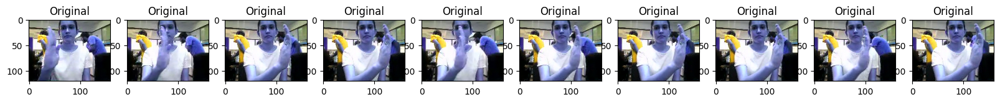

In [16]:
# testing generative 
sample_test_generator = generator(train_path, train_doc, 1, is_train = True, augmention = enable_augmentation, debug = True)
d = next(sample_test_generator)[0]

## Model Network
Here you make the model using different functionalities that Keras provides. 

After understanding and acquiring the dataset, the next step is to try out different architectures to solve this problem. 

 

For analysing videos using neural networks, two types of architectures are used commonly. One is the `standard CNN + RNN architecture` in which you pass the images of a video through a CNN which extracts a feature vector for each image, and then pass the sequence of these feature vectors through an RNN. 

The other popular architecture used to process videos is a natural extension of `CNNs - a 3D convolutional network`.

In [17]:
!pip install --upgrade tensorflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 601.3/601.3 MB 2.8 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 6.8 MB/s eta 0:00:00:00:01:00:01
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.16.2
    Uninstalling tensorboard-2.16.2:
      Successfully uninstalled tensorboard-2.16.2
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.16.1
    Uninstalling tensorflow-2.16.1:
      Successfully uninstalled tensorflow-2.16.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-decision-forests 1.9.1 requires tensorflow~=2.16.1, but you have tensorflow 2.17.0 which is incompatible.
tensorflow-text 2.16.1 requires tensorflow<2.17,>=2.16.1; platform_machine != "arm64" or platform_system != "Darwin", but you have tensorflow 2.17.0 which is incompatible.
tf-keras 2.

In [18]:
import tensorflow as tf
print(f"TensorFlow version: {tf.__version__}")
gpus = tf.config.list_physical_devices('GPU')
print(f"GPUs detected: {gpus}")

TensorFlow version: 2.16.1
GPUs detected: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]


In [19]:
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, GRU, Flatten, TimeDistributed, Bidirectional, BatchNormalization, Activation, Dropout, GlobalAveragePooling2D, GlobalAveragePooling3D, ConvLSTM2D, LSTM, GRU
# Import options for Convolutional and Pooling layers
from tensorflow.keras.layers import Conv2D, Conv3D, MaxPooling2D, MaxPooling3D
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
from tensorflow import optimizers


In [20]:
#input shape for the first layer
input_shape = (len(seq_idx), dim_x, dim_y, 3)

## Setting the generators

Let us create the `train_generator` and the `val_generator` which will be used in `.fit_generator`.

In [21]:
train_generator = generator(train_path, train_doc, batch_size, is_train = True, augmention = enable_augmentation)
val_generator = generator(val_path, val_doc, batch_size)

## Using checkpoints to save keras model

In [22]:
model_name = 'model_init' + '_' + str(curr_dt_time).replace(' ','').replace(':','_') + '/'
    
if not os.path.exists(model_name):
    os.mkdir(model_name)
        
filepath = model_name + 'model-{epoch:05d}-{loss:.5f}-{categorical_accuracy:.5f}-{val_loss:.5f}-{val_categorical_accuracy:.5f}.keras'

checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, save_weights_only=False, mode='auto', save_freq='epoch')

In [23]:
LR = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.001, verbose=1)
callbacks_list = [checkpoint, LR]

The `steps_per_epoch` and `validation_steps` are used by `fit_generator` to decide the number of next() calls it need to make.

In [24]:
if (num_train_sequences%batch_size) == 0:
    steps_per_epoch = int(num_train_sequences/batch_size)
else:
    steps_per_epoch = (num_train_sequences//batch_size) + 1

if (num_val_sequences%batch_size) == 0:
    validation_steps = int(num_val_sequences/batch_size)
else:
    validation_steps = (num_val_sequences//batch_size) + 1

## Util function to calculate loss and accuracy of the current model training

In [25]:
def plot_loss_and_accuracy(history, figsize=(20, 6)):
    """
    Plots model loss and categorical accuracy for both training and validation sets.

    Parameters:
        history : object 
            History object from model training (usually from `model.fit()`).
        figsize : tuple 
            Size of the figure (default is (20,6)).
    """
    # Create figure with specified size
    plt.figure(figsize=figsize)

    # Subplot 1: Loss visualization
    ax1 = plt.subplot(121)  # 1 row, 2 columns, first subplot
    ax1.plot(history.history['loss'], color='orange', label='Train Loss')
    ax1.plot(history.history['val_loss'], color='blue', label='Validation Loss')
    plt.title('Model Loss', fontsize=14, weight='bold')
    plt.ylabel('Loss', fontsize=12)
    plt.xlabel('Epoch', fontsize=12)
    plt.legend(loc='lower left')

    # Subplot 2: Accuracy visualization
    ax2 = plt.subplot(122)  # 1 row, 2 columns, second subplot
    ax2.plot(history.history['categorical_accuracy'], color='green', label='Train Accuracy')
    ax2.plot(history.history['val_categorical_accuracy'], color='red', label='Validation Accuracy')
    plt.title('Model Accuracy', fontsize=14, weight='bold')
    plt.ylabel('Accuracy (categorical)', fontsize=12)
    plt.xlabel('Epoch', fontsize=12)
    plt.legend(loc='lower left')

    # Show the plots
    plt.tight_layout()   # To avoid overlap of subplots
    plt.show()


## Training Models

We will be trying three types of models here

#### 3D Convolutional Network, or Conv3D
3D convolutions are a natural extension to the 2D convolutions you are already familiar with. Just like in 2D conv, you move the filter in two directions (x and y), in 3D conv, you move the filter in three directions (x, y and z). In this case, the input to a 3D conv is a video (which is a sequence of 30 RGB images). If we assume that the shape of each image is 100x100x3, for example, the video becomes a 4-D tensor of shape 100x100x3x30 which can be written as (100x100x30)x3 where 3 is the number of channels. Hence, deriving the analogy from 2-D convolutions where a 2-D kernel/filter (a square filter) is represented as (fxf)xc where f is filter size and c is the number of channels, a 3-D kernel/filter (a 'cubic' filter) is represented as (fxfxf)xc (here c = 3 since the input images have three channels). This cubic filter will now '3D-convolve' on each of the three channels of the (100x100x30) tensor.

#### 2D Convolutions + RNN

The conv2D network will extract a feature vector for each image, and a sequence of these feature vectors is then fed to an RNN-based network. The output of the RNN is a regular softmax (for a classification problem such as this one).

#### 

#### 2D Convolutions + RNN with Transfer learning

Here additionally we will be using a pretrained model and add 2D convolutional layers with LSTM or GRU.

### Model 1 : Conv3D with MaxPooling3D

Remember to use `Conv3D` and `MaxPooling3D` and not `Conv2D` and `Maxpooling2D` for a 3D convolution model. 

In [26]:
model1 = Sequential(name="Conv3D_MaxPooling3D")

model1.add(Conv3D(32, kernel_size=3, activation='relu', input_shape=input_shape))
model1.add(Conv3D(64, kernel_size=3, activation='relu'))
model1.add(MaxPooling3D(pool_size=(2, 2, 2)))

model1.add(Conv3D(128, kernel_size=3, activation='relu'))
model1.add(MaxPooling3D(pool_size=(1, 2, 2)))

model1.add(Conv3D(256, kernel_size=(1, 3, 3), activation='relu'))
model1.add(MaxPooling3D(pool_size=(1, 2, 2)))

model1.add(Conv3D(512, kernel_size=(1, 3, 3), activation='relu'))
model1.add(Conv3D(512, kernel_size=(1, 3, 3), activation='relu'))
model1.add(MaxPooling3D(pool_size=(1, 2, 2)))

model1.add(Flatten())
model1.add(Dense(512, activation='relu'))
model1.add(Dense(5, activation='softmax'))

Now that you have written the model, the next step is to `compile` the model. When you print the `summary` of the model, you'll see the total number of parameters you have to train.

In [27]:
optimiser = optimizers.Adam(learning_rate=0.01)
model1.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])
print (model1.summary())

Model: "Conv3D_MaxPooling3D"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv3d (Conv3D)                 │ (None, 8, 118, 118,    │         2,624 │
│                                 │ 32)                    │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d_1 (Conv3D)               │ (None, 6, 116, 116,    │        55,360 │
│                                 │ 64)                    │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d (MaxPooling3D)    │ (None, 3, 58, 58, 64)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d_2 (Conv3D)               │ (None, 1, 56, 56, 128) │       221,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_1 (MaxPooling3D)  │ (None, 1, 28, 28, 128) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d_3 (Conv3D)               │ (None, 1, 26, 26, 256) │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_2 (MaxPooling3D)  │ (None, 1, 13, 13, 256) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d_4 (Conv3D)               │ (None, 1, 11, 11, 512) │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d_5 (Conv3D)               │ (None, 1, 9, 9, 512)   │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_3 (MaxPooling3D)  │ (None, 1, 4, 4, 512)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │     4,194,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 5)              │         2,565 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 8,311,813 (31.71 MB)

 Trainable params: 8,311,813 (31.71 MB)

 Non-trainable params: 0 (0.00 B)

None


In [28]:
history1 = model1.fit(train_generator, steps_per_epoch=steps_per_epoch, epochs=num_epochs, verbose=1, 
                    callbacks=callbacks_list, validation_data=val_generator, 
                    validation_steps=validation_steps, class_weight=None, initial_epoch=0)

Epoch 1/50


I0000 00:00:1727771243.909688     101 service.cc:145] XLA service 0x7e48b00057f0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1727771243.909744     101 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1727771243.909750     101 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
2024-10-01 08:27:34.121651: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng0{} for conv (f32[40,64,3,58,58]{4,3,2,1,0}, u8[0]{0}) custom-call(f32[40,128,1,56,56]{4,3,2,1,0}, f32[128,64,3,3,3]{4,3,2,1,0}), window={size=3x3x3}, dim_labels=bf012_oi012->bf012, custom_call_target="__cudnn$convBackwardInput", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0}} is taking a while...
2024-10-01 08:27:34.142358: E external/local_xla

16/17 ━━━━━━━━━━━━━━━━━━━━ 5s 6s/step - categorical_accuracy: 0.1923 - loss: 19332.3301 

2024-10-01 08:29:27.077145: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng0{} for conv (f32[23,32,8,118,118]{4,3,2,1,0}, u8[0]{0}) custom-call(f32[23,64,6,116,116]{4,3,2,1,0}, f32[64,32,3,3,3]{4,3,2,1,0}), window={size=3x3x3}, dim_labels=bf012_oi012->bf012, custom_call_target="__cudnn$convBackwardInput", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0}} is taking a while...
2024-10-01 08:29:28.309595: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 2.232551097s
Trying algorithm eng0{} for conv (f32[23,32,8,118,118]{4,3,2,1,0}, u8[0]{0}) custom-call(f32[23,64,6,116,116]{4,3,2,1,0}, f32[64,32,3,3,3]{4,3,2,1,0}), window={size=3x3x3}, dim_labels=bf012_oi012->bf012, custom_call_target="__cudnn$convBackwardInput", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"c

17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - categorical_accuracy: 0.1928 - loss: 18656.3555
Epoch 1: val_loss improved from inf to 1.62793, saving model to model_init_2024-10-0108_25_24.658942/model-00001-7840.77051-0.20060-1.62793-0.18000.keras
17/17 ━━━━━━━━━━━━━━━━━━━━ 160s 8s/step - categorical_accuracy: 0.1933 - loss: 18055.4902 - val_categorical_accuracy: 0.1800 - val_loss: 1.6279 - learning_rate: 0.0100
Epoch 2/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - categorical_accuracy: 0.2002 - loss: 1.6184
Epoch 2: val_loss improved from 1.62793 to 1.61105, saving model to model_init_2024-10-0108_25_24.658942/model-00002-1.61703-0.19457-1.61105-0.22000.keras
17/17 ━━━━━━━━━━━━━━━━━━━━ 29s 2s/step - categorical_accuracy: 0.1999 - loss: 1.6183 - val_categorical_accuracy: 0.2200 - val_loss: 1.6110 - learning_rate: 0.0100
Epoch 3/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - categorical_accuracy: 0.1750 - loss: 1.6123
Epoch 3: val_loss improved from 1.61105 to 1.60787, saving model to model_init_202

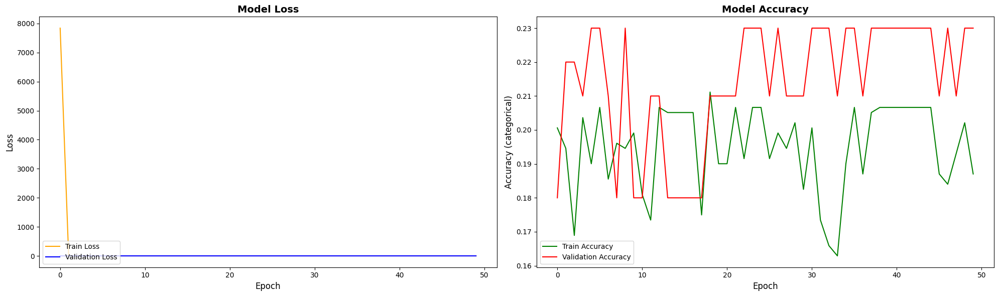

In [29]:
plot_loss_and_accuracy(history1)

### Model 2 : Conv3D using BatchNormalization with MaxPooling3D

Conv3D with MaxPooling3D and Batch Normalization


In [30]:
model2 = Sequential(name="Conv3D_BatchNormalization_MaxPooling3D")

model2.add(Conv3D(32, kernel_size=3, activation='relu', input_shape=input_shape))
model2.add(Conv3D(64, kernel_size=3, activation='relu'))
model2.add(MaxPooling3D(pool_size=(2, 2, 2)))
model2.add(BatchNormalization())

model2.add(Conv3D(128, kernel_size=3, activation='relu'))
model2.add(MaxPooling3D(pool_size=(1, 2, 2)))
model2.add(BatchNormalization())

model2.add(Conv3D(256, kernel_size=(1, 3, 3), activation='relu'))
model2.add(MaxPooling3D(pool_size=(1, 2, 2)))
model2.add(BatchNormalization())

model2.add(Conv3D(512, kernel_size=(1, 3, 3), activation='relu'))
model2.add(Conv3D(512, kernel_size=(1, 3, 3), activation='relu'))
model2.add(MaxPooling3D(pool_size=(1, 2, 2)))
model2.add(BatchNormalization())

model2.add(Flatten())
model2.add(Dense(512, activation='relu'))
model2.add(BatchNormalization())
model2.add(Dense(5, activation='softmax'))

In [31]:
optimiser = optimizers.Adam(learning_rate=0.01)
model2.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])
print (model2.summary())

Model: "Conv3D_BatchNormalization_MaxPooling3D"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv3d_6 (Conv3D)               │ (None, 8, 118, 118,    │         2,624 │
│                                 │ 32)                    │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d_7 (Conv3D)               │ (None, 6, 116, 116,    │        55,360 │
│                                 │ 64)                    │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_4 (MaxPooling3D)  │ (None, 3, 58, 58, 64)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 3, 58, 58, 64)  │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d_8 (Conv3D)               │ (None, 1, 56, 56, 128) │       221,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_5 (MaxPooling3D)  │ (None, 1, 28, 28, 128) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 1, 28, 28, 128) │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d_9 (Conv3D)               │ (None, 1, 26, 26, 256) │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_6 (MaxPooling3D)  │ (None, 1, 13, 13, 256) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 1, 13, 13, 256) │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d_10 (Conv3D)              │ (None, 1, 11, 11, 512) │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d_11 (Conv3D)              │ (None, 1, 9, 9, 512)   │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_7 (MaxPooling3D)  │ (None, 1, 4, 4, 512)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 1, 4, 4, 512)   │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 512)            │     4,194,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 5)              │         2,565 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 8,317,701 (31.73 MB)

 Trainable params: 8,314,757 (31.72 MB)

 Non-trainable params: 2,944 (11.50 KB)

None


In [32]:
history2 = model2.fit(train_generator, steps_per_epoch=steps_per_epoch, epochs=num_epochs, verbose=1, 
                    callbacks=callbacks_list, validation_data=val_generator, 
                    validation_steps=validation_steps, class_weight=None, initial_epoch=0)

Epoch 1/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - categorical_accuracy: 0.3622 - loss: 3.3724
Epoch 1: val_loss did not improve from 1.60583
17/17 ━━━━━━━━━━━━━━━━━━━━ 47s 2s/step - categorical_accuracy: 0.3621 - loss: 3.3332 - val_categorical_accuracy: 0.1900 - val_loss: 6814.9238 - learning_rate: 0.0100
Epoch 2/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - categorical_accuracy: 0.3739 - loss: 1.6115
Epoch 2: val_loss did not improve from 1.60583
17/17 ━━━━━━━━━━━━━━━━━━━━ 31s 2s/step - categorical_accuracy: 0.3767 - loss: 1.6039 - val_categorical_accuracy: 0.2800 - val_loss: 991.2877 - learning_rate: 0.0100
Epoch 3/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - categorical_accuracy: 0.5394 - loss: 1.2008
Epoch 3: val_loss did not improve from 1.60583
17/17 ━━━━━━━━━━━━━━━━━━━━ 31s 2s/step - categorical_accuracy: 0.5404 - loss: 1.1973 - val_categorical_accuracy: 0.2100 - val_loss: 240.5606 - learning_rate: 0.0100
Epoch 4/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - categorical_accuracy: 0.591

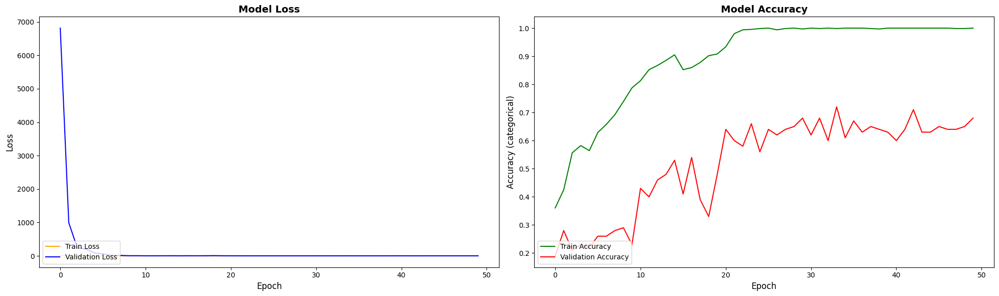

In [33]:
plot_loss_and_accuracy(history2)

### Model 3 : Conv3D with MaxPooling3D with Batch Normalization and Dropouts


In [34]:
model3 = Sequential(name="Conv3D_BatchNormalization_Dropouts_MaxPooling3D")

model3.add(Conv3D(32, kernel_size=3, activation='relu', input_shape=input_shape))
model3.add(Conv3D(64, kernel_size=3, activation='relu'))
model3.add(MaxPooling3D(pool_size=(2, 2, 2)))
model3.add(BatchNormalization())
model3.add(Dropout(0.2))

model3.add(Conv3D(128, kernel_size=3, activation='relu'))
model3.add(MaxPooling3D(pool_size=(1, 2, 2)))
model3.add(BatchNormalization())
model3.add(Dropout(0.2))

model3.add(Conv3D(256, kernel_size=(1, 3, 3), activation='relu'))
model3.add(MaxPooling3D(pool_size=(1, 2, 2)))
model3.add(BatchNormalization())
model3.add(Dropout(0.2))

model3.add(Flatten())
model3.add(Dense(512, activation='relu'))
model3.add(BatchNormalization())
model3.add(Dense(5, activation='softmax'))

In [35]:
optimiser = optimizers.Adam(learning_rate=0.01)
model3.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])
print (model3.summary())

Model: "Conv3D_BatchNormalization_Dropouts_MaxPooling3D"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv3d_12 (Conv3D)              │ (None, 8, 118, 118,    │         2,624 │
│                                 │ 32)                    │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d_13 (Conv3D)              │ (None, 6, 116, 116,    │        55,360 │
│                                 │ 64)                    │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_8 (MaxPooling3D)  │ (None, 3, 58, 58, 64)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 3, 58, 58, 64)  │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 3, 58, 58, 64)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d_14 (Conv3D)              │ (None, 1, 56, 56, 128) │       221,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_9 (MaxPooling3D)  │ (None, 1, 28, 28, 128) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 1, 28, 28, 128) │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1, 28, 28, 128) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d_15 (Conv3D)              │ (None, 1, 26, 26, 256) │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_10 (MaxPooling3D) │ (None, 1, 13, 13, 256) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 1, 13, 13, 256) │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 1, 13, 13, 256) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 43264)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 512)            │    22,151,680 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_8           │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 5)              │         2,565 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 22,732,549 (86.72 MB)

 Trainable params: 22,730,629 (86.71 MB)

 Non-trainable params: 1,920 (7.50 KB)

None


In [36]:
history3 = model3.fit(train_generator, steps_per_epoch=steps_per_epoch, epochs=num_epochs, verbose=1, 
                    callbacks=callbacks_list, validation_data=val_generator, 
                    validation_steps=validation_steps, class_weight=None, initial_epoch=0)

Epoch 1/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - categorical_accuracy: 0.4029 - loss: 3.2547
Epoch 1: val_loss did not improve from 1.21187
17/17 ━━━━━━━━━━━━━━━━━━━━ 59s 3s/step - categorical_accuracy: 0.4064 - loss: 3.2131 - val_categorical_accuracy: 0.2400 - val_loss: 5449.8789 - learning_rate: 0.0100
Epoch 2/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - categorical_accuracy: 0.6155 - loss: 1.0473
Epoch 2: val_loss did not improve from 1.21187
17/17 ━━━━━━━━━━━━━━━━━━━━ 28s 2s/step - categorical_accuracy: 0.6154 - loss: 1.0463 - val_categorical_accuracy: 0.2200 - val_loss: 823.7631 - learning_rate: 0.0100
Epoch 3/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - categorical_accuracy: 0.6940 - loss: 0.8458
Epoch 3: val_loss did not improve from 1.21187
17/17 ━━━━━━━━━━━━━━━━━━━━ 31s 2s/step - categorical_accuracy: 0.6954 - loss: 0.8402 - val_categorical_accuracy: 0.1800 - val_loss: 112.6758 - learning_rate: 0.0100
Epoch 4/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - categorical_accuracy: 0.756

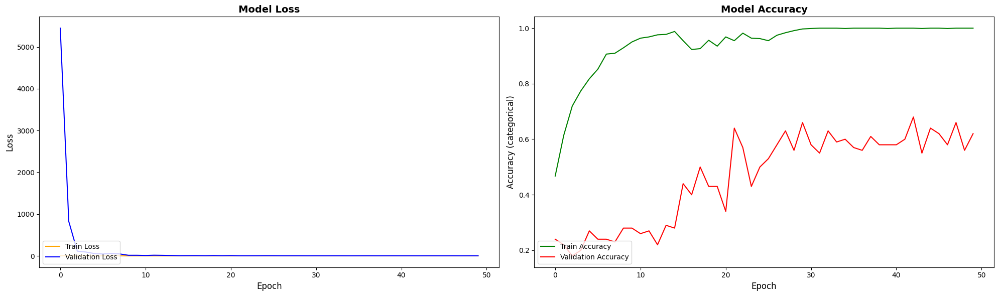

In [37]:
plot_loss_and_accuracy(history3)

### Model 4 : Conv3D with MaxPooling3D with Batch Normalization and Dropouts using GlobalAveragePooling3D

Conv3D with MaxPooling3D with Batch Normalization and Dropouts using GlobalAveragePooling3D


In [38]:

model4 = Sequential(name="Conv3D_BatchNormalization_Dropouts_GlobalAveragePooling3D")

model4.add(Conv3D(32, kernel_size=3, activation='relu', input_shape=input_shape))
model4.add(Conv3D(64, kernel_size=3, activation='relu'))
model4.add(MaxPooling3D(pool_size=(2, 2, 2)))
model4.add(BatchNormalization())
model4.add(Dropout(0.2))

model4.add(Conv3D(128, kernel_size=3, activation='relu'))
model4.add(MaxPooling3D(pool_size=(1, 2, 2)))
model4.add(BatchNormalization())
model4.add(Dropout(0.2))

model4.add(Conv3D(256, kernel_size=(1, 3, 3), activation='relu'))
model4.add(MaxPooling3D(pool_size=(1, 2, 2)))
model4.add(BatchNormalization())
model4.add(Dropout(0.2))

model4.add(GlobalAveragePooling3D())
model4.add(Dense(512, activation='relu'))
model4.add(BatchNormalization())
model4.add(Dense(5, activation='softmax'))

In [39]:
optimiser = optimizers.Adam(learning_rate=0.01)
model4.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])
print (model4.summary())

Model: "Conv3D_BatchNormalization_Dropouts_GlobalAveragePooling3D"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv3d_16 (Conv3D)              │ (None, 8, 118, 118,    │         2,624 │
│                                 │ 32)                    │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d_17 (Conv3D)              │ (None, 6, 116, 116,    │        55,360 │
│                                 │ 64)                    │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_11 (MaxPooling3D) │ (None, 3, 58, 58, 64)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_9           │ (None, 3, 58, 58, 64)  │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 3, 58, 58, 64)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d_18 (Conv3D)              │ (None, 1, 56, 56, 128) │       221,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_12 (MaxPooling3D) │ (None, 1, 28, 28, 128) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_10          │ (None, 1, 28, 28, 128) │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 1, 28, 28, 128) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d_19 (Conv3D)              │ (None, 1, 26, 26, 256) │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_13 (MaxPooling3D) │ (None, 1, 13, 13, 256) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_11          │ (None, 1, 13, 13, 256) │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 1, 13, 13, 256) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling3d        │ (None, 256)            │             0 │
│ (GlobalAveragePooling3D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 512)            │       131,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_12          │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 5)              │         2,565 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 712,453 (2.72 MB)

 Trainable params: 710,533 (2.71 MB)

 Non-trainable params: 1,920 (7.50 KB)

None


Let us now fit the model. This will start training the model and with the help of the checkpoints, you'll be able to save the model at the end of each epoch.

In [40]:
history4 = model4.fit(train_generator, steps_per_epoch=steps_per_epoch, epochs=num_epochs, verbose=1, 
                    callbacks=callbacks_list, validation_data=val_generator, 
                    validation_steps=validation_steps, class_weight=None, initial_epoch=0)

Epoch 1/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - categorical_accuracy: 0.2915 - loss: 3.0462
Epoch 1: val_loss did not improve from 1.21187
17/17 ━━━━━━━━━━━━━━━━━━━━ 60s 3s/step - categorical_accuracy: 0.2926 - loss: 3.0202 - val_categorical_accuracy: 0.1800 - val_loss: 1763.3622 - learning_rate: 0.0100
Epoch 2/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - categorical_accuracy: 0.3237 - loss: 1.7650
Epoch 2: val_loss did not improve from 1.21187
17/17 ━━━━━━━━━━━━━━━━━━━━ 26s 2s/step - categorical_accuracy: 0.3250 - loss: 1.7609 - val_categorical_accuracy: 0.2300 - val_loss: 537.5711 - learning_rate: 0.0100
Epoch 3/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - categorical_accuracy: 0.3610 - loss: 1.8421
Epoch 3: val_loss did not improve from 1.21187
17/17 ━━━━━━━━━━━━━━━━━━━━ 32s 2s/step - categorical_accuracy: 0.3639 - loss: 1.8254 - val_categorical_accuracy: 0.2300 - val_loss: 179.4618 - learning_rate: 0.0100
Epoch 4/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - categorical_accuracy: 0.447

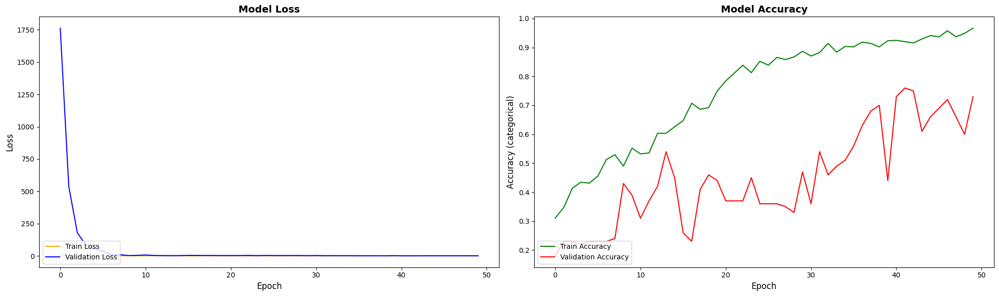

In [41]:
plot_loss_and_accuracy(history4)

### Model 5 : TimeDistributed Conv2D + Dense

TimeDistributed Conv2D + Dense

You would want to use `TimeDistributed` while building a Conv2D + RNN model. Also remember that the last layer is the softmax. 



Let me walk you through the architecture step by step:

## 1. **Conv2D (Convolutional Layer)**
Conv2D layers are primarily used to extract spatial features from images. For example, you might want to detect edges, textures, and more complex patterns from an image (like objects or faces). A Conv2D layer slides filters over the input images to produce a 2D feature map of the extracted features.

- **Input to Conv2D**: A single image or frame.
- **Output of Conv2D**: A feature map that highlights certain features in the image.

## 2. **TimeDistributed Layer**
When working with a **sequence of images** (such as frames in a video), we can’t apply a Conv2D layer to the whole sequence at the same time. Instead, we apply the Conv2D layer 🔄 ***to each frame independently.***
This is where the `TimeDistributed` layer comes in. It wraps a layer (like Conv2D) and applies it across each time step or frame independently.

### Example:  
For instance, if you have a **video sequence** with `T` frames, each frame would be processed through the same Conv2D layer.
 
- **Input Dimension**: `T x H x W x Channels` (A sequence of T images, each with height `H`, width `W`, and depth `Channels`).
- **Output Dimension after TimeDistributed Conv2D**: `T x FeatureMapHeight x FeatureMapWidth x NumFilters` (Each frame now has its own set of spatial `FeatureMaps`).



In [42]:
model5 = Sequential(name="TimeDistributed_Conv2D_Dense")
model5.add(TimeDistributed(
    Conv2D(32, (3,3), activation='relu'), input_shape=input_shape)
)
model5.add(TimeDistributed(
    MaxPooling2D((2,2)))
)
model5.add(BatchNormalization())

model5.add(TimeDistributed(
    Conv2D(64, (3,3), activation='relu'))
)
model5.add(TimeDistributed(
    MaxPooling2D((2,2)))
)
model5.add(BatchNormalization())

model5.add(TimeDistributed(
    Conv2D(128, (3,3), activation='relu'))
)
model5.add(TimeDistributed(
    MaxPooling2D((2,2)))
)
model5.add(BatchNormalization())

model5.add(GlobalAveragePooling3D())
model5.add(Dense(256, activation='relu'))
model5.add(BatchNormalization())
model5.add(Dense(5, activation='softmax'))

In [43]:
optimiser = optimizers.Adam(learning_rate=0.01)
model5.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])
print (model5.summary())

Model: "TimeDistributed_Conv2D_Dense"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ time_distributed                │ (None, 10, 118, 118,   │           896 │
│ (TimeDistributed)               │ 32)                    │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_1              │ (None, 10, 59, 59, 32) │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_13          │ (None, 10, 59, 59, 32) │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_2              │ (None, 10, 57, 57, 64) │        18,496 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_3              │ (None, 10, 28, 28, 64) │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_14          │ (None, 10, 28, 28, 64) │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_4              │ (None, 10, 26, 26,     │        73,856 │
│ (TimeDistributed)               │ 128)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_5              │ (None, 10, 13, 13,     │             0 │
│ (TimeDistributed)               │ 128)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_15          │ (None, 10, 13, 13,     │           512 │
│ (BatchNormalization)            │ 128)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling3d_1      │ (None, 128)            │             0 │
│ (GlobalAveragePooling3D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 256)            │        33,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_16          │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 5)              │         1,285 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 129,477 (505.77 KB)

 Trainable params: 128,517 (502.02 KB)

 Non-trainable params: 960 (3.75 KB)

None


In [44]:
history5 = model5.fit(train_generator, steps_per_epoch=steps_per_epoch, epochs=num_epochs, verbose=1, 
                    callbacks=callbacks_list, validation_data=val_generator, 
                    validation_steps=validation_steps, class_weight=None, initial_epoch=0)

Epoch 1/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - categorical_accuracy: 0.3692 - loss: 1.9758
Epoch 1: val_loss did not improve from 0.70356
17/17 ━━━━━━━━━━━━━━━━━━━━ 51s 2s/step - categorical_accuracy: 0.3741 - loss: 1.9527 - val_categorical_accuracy: 0.2100 - val_loss: 43.5261 - learning_rate: 0.0100
Epoch 2/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - categorical_accuracy: 0.4752 - loss: 1.4609
Epoch 2: val_loss did not improve from 0.70356
17/17 ━━━━━━━━━━━━━━━━━━━━ 27s 2s/step - categorical_accuracy: 0.4772 - loss: 1.4528 - val_categorical_accuracy: 0.2700 - val_loss: 22.0646 - learning_rate: 0.0100
Epoch 3/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - categorical_accuracy: 0.5378 - loss: 1.1412
Epoch 3: val_loss did not improve from 0.70356
17/17 ━━━━━━━━━━━━━━━━━━━━ 30s 2s/step - categorical_accuracy: 0.5398 - loss: 1.1388 - val_categorical_accuracy: 0.2400 - val_loss: 10.7200 - learning_rate: 0.0100
Epoch 4/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - categorical_accuracy: 0.6810 - 

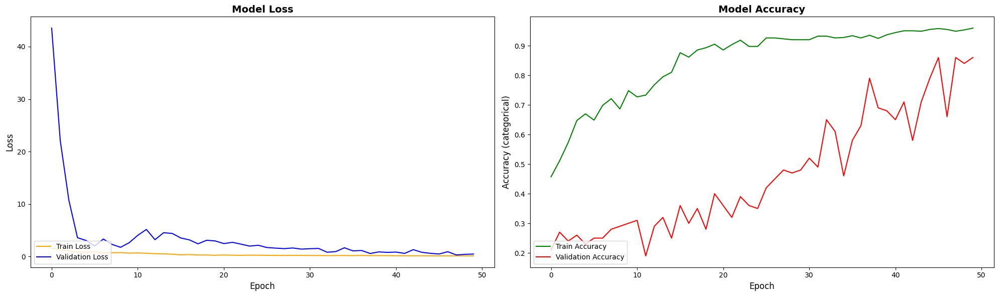

In [45]:
plot_loss_and_accuracy(history5)

### Model  6 : TimeDistributed Conv2D + GRU

#### GRU (Gated Recurrent Unit)

After extracting the spatial features from each frame using Conv2D (using the TimeDistributed wrapper), you want to capture temporal dependencies between the frames of the video. This is where the GRU comes into play. It's a type of Recurrent Layer , which processes sequences and is designed to learn the temporal or sequential patterns.

Input to GRU : The sequence of feature maps for each frame (flattened spatial features).
Output of GRU : A sequential output that captures the temporal dynamics (how features change across time).

In [46]:
model6 = Sequential(name="TimeDistributed_Conv2D_GRU")
model6.add(TimeDistributed(
    Conv2D(32, (3,3), activation='relu'), input_shape=input_shape)
)
model6.add(TimeDistributed(
    MaxPooling2D((2,2)))
)
model6.add(BatchNormalization())
model6.add(Dropout(0.2))

model6.add(TimeDistributed(
    Conv2D(64, (3,3), activation='relu'))
)
model6.add(TimeDistributed(
    MaxPooling2D((2,2)))
)
model6.add(BatchNormalization())
model6.add(Dropout(0.2))

model6.add(TimeDistributed(GlobalAveragePooling2D()))
model6.add(TimeDistributed(Dense(64, activation='relu')))
model6.add(BatchNormalization())
model6.add(Dropout(0.2))

model6.add(GRU(128))
model6.add(BatchNormalization())
model6.add(Dense(5, activation='softmax'))

In [47]:
optimiser = optimizers.Adam(learning_rate=0.01)
model6.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])
print (model6.summary())

Model: "TimeDistributed_Conv2D_GRU"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ time_distributed_6              │ (None, 10, 118, 118,   │           896 │
│ (TimeDistributed)               │ 32)                    │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_7              │ (None, 10, 59, 59, 32) │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_17          │ (None, 10, 59, 59, 32) │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 10, 59, 59, 32) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_8              │ (None, 10, 57, 57, 64) │        18,496 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_9              │ (None, 10, 28, 28, 64) │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_18          │ (None, 10, 28, 28, 64) │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 10, 28, 28, 64) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_10             │ (None, 10, 64)         │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_11             │ (None, 10, 64)         │         4,160 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_19          │ (None, 10, 64)         │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 10, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru (GRU)                       │ (None, 128)            │        74,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_20          │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 5)              │           645 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 99,845 (390.02 KB)

 Trainable params: 99,269 (387.77 KB)

 Non-trainable params: 576 (2.25 KB)

None


In [48]:
history6 = model6.fit(train_generator, steps_per_epoch=steps_per_epoch, epochs=num_epochs, verbose=1, 
                    callbacks=callbacks_list, validation_data=val_generator, 
                    validation_steps=validation_steps, class_weight=None, initial_epoch=0)

Epoch 1/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - categorical_accuracy: 0.3473 - loss: 1.9166
Epoch 1: val_loss did not improve from 0.31157
17/17 ━━━━━━━━━━━━━━━━━━━━ 42s 2s/step - categorical_accuracy: 0.3503 - loss: 1.9012 - val_categorical_accuracy: 0.2700 - val_loss: 2.3189 - learning_rate: 0.0100
Epoch 2/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - categorical_accuracy: 0.4021 - loss: 1.3319
Epoch 2: val_loss did not improve from 0.31157
17/17 ━━━━━━━━━━━━━━━━━━━━ 32s 2s/step - categorical_accuracy: 0.4060 - loss: 1.3237 - val_categorical_accuracy: 0.1900 - val_loss: 2.4566 - learning_rate: 0.0100
Epoch 3/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - categorical_accuracy: 0.5802 - loss: 0.9740
Epoch 3: val_loss did not improve from 0.31157
17/17 ━━━━━━━━━━━━━━━━━━━━ 30s 2s/step - categorical_accuracy: 0.5796 - loss: 0.9747 - val_categorical_accuracy: 0.2000 - val_loss: 2.8266 - learning_rate: 0.0100
Epoch 4/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - categorical_accuracy: 0.5714 - los

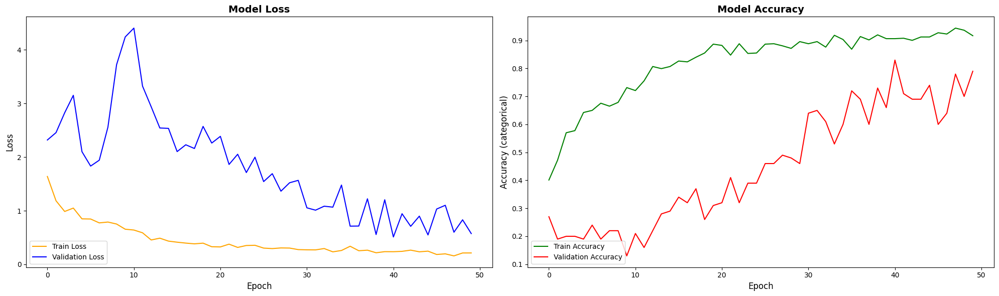

In [49]:
plot_loss_and_accuracy(history6)

### Model 7 : TimeDistributed + ConvLSTM2D

TimeDistributed + ConvLSTM2D

To explain the combination of `TimeDistributed` and `ConvLSTM2D`, let’s break it down step by step and explore why they are used together in deep learning.

### 1. What is `ConvLSTM2D`?
`ConvLSTM2D` is a **Convolutional Long Short-Term Memory** (ConvLSTM) unit specifically for handling spatiotemporal data. It combines the convolutional operation with the LSTM architecture, allowing it to work well with inputs that have both spatial (e.g., images, video frames) and temporal (e.g., sequences over time) dependencies.

- **Convolutions:** ConvLSTM2D applies convolution on its input instead of simple multiplication (like traditional LSTMs). This means it’s specifically designed for **grid-like spatial data** (e.g., image pixels), where the relationship of nearby pixels is crucial.
  
- **LSTM Dynamics:** It captures **temporal dependencies** just like an LSTM does, by holding hidden states and memory across multiple time steps.

#### **Why is `ConvLSTM2D` useful?**
ConvLSTM2D is particularly helpful for problems involving videos, weather prediction, and other areas where the information has both temporal and spatial dimensions. For example, in video classification, each frame is spatial, but there is also temporal information that shows how the frames evolve over time.

```plaintext
Input format example: (batch_size, time_steps, height, width, channels)
```

### 2. What is `TimeDistributed`?
`TimeDistributed` is a wrapper in Keras that applies a layer (like Dense, Conv2D, etc.) **independently to each time step** in an input sequence. This is especially useful when you're dealing with data that is fed into a model as a sequence of frames, and you want to apply the same processing across each frame.

- Think of `TimeDistributed` as a way to apply a layer (say, a **Dense** or **Conv2D** layer) on **each time step or slice of the sequence** **independently**. This ensures that the same weights are applied across every frame in a video sequence.

#### **Why use `TimeDistributed`?**
When you have temporal data with frames (e.g., a video or sequence of images), the temporal dimension is treated separately so you can perform spatial operations on individual frames without losing temporal structure.

### 3. Combining `TimeDistributed` with `ConvLSTM2D`
The combination of `TimeDistributed` and `ConvLSTM2D` layers is essential when you want to:

- **Use Convolutional layers across time steps** to capture spatial features from individual frames (each frame being a spatial map with channels like an RGB image).
- **Use ConvLSTM to learn temporal dependencies** while keeping track of spatial data (stored in the convolution structure) across each time step.



### Summary of Reasons to Combine `TimeDistributed` + `ConvLSTM2D`:

- **ConvLSTM2D** enables capturing both spatial and temporal patterns from sequences of images or data.
- **TimeDistributed** allows you to apply layers **independently** to each frame enabling you to process each time step in a sequence with the same layer wrapping.



In [50]:
model7 = Sequential(name="TimeDistributed_ConvLSTM2D")
model7.add(TimeDistributed(
    Conv2D(8, (3,3), activation='relu'), input_shape=input_shape)
)
model7.add(BatchNormalization())
model7.add(TimeDistributed(
    Conv2D(16, (3,3), activation='relu'))
)
model7.add(BatchNormalization())
model7.add(
    ConvLSTM2D(8, kernel_size = 3, return_sequences=False)
)
model7.add(BatchNormalization())
model7.add(TimeDistributed(
    Dense(64, activation='relu'))
)
model7.add(BatchNormalization())
model7.add(GlobalAveragePooling2D())
model7.add(Dense(64, activation='relu'))
model7.add(Dense(5, activation='softmax'))

In [51]:
optimiser = optimizers.Adam(learning_rate=0.01)
model7.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])
print (model7.summary())

Model: "TimeDistributed_ConvLSTM2D"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ time_distributed_12             │ (None, 10, 118, 118,   │           224 │
│ (TimeDistributed)               │ 8)                     │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_21          │ (None, 10, 118, 118,   │            32 │
│ (BatchNormalization)            │ 8)                     │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_13             │ (None, 10, 116, 116,   │         1,168 │
│ (TimeDistributed)               │ 16)                    │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_22          │ (None, 10, 116, 116,   │            64 │
│ (BatchNormalization)            │ 16)                    │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_lstm2d (ConvLSTM2D)        │ (None, 114, 114, 8)    │         6,944 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_23          │ (None, 114, 114, 8)    │            32 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_14             │ (None, 114, 114, 64)   │           576 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_24          │ (None, 114, 114, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 64)             │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 5)              │           325 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 13,781 (53.83 KB)

 Trainable params: 13,589 (53.08 KB)

 Non-trainable params: 192 (768.00 B)

None


In [52]:
history7 = model7.fit(train_generator, steps_per_epoch=steps_per_epoch, epochs=num_epochs, verbose=1, 
                    callbacks=callbacks_list, validation_data=val_generator, 
                    validation_steps=validation_steps, class_weight=None, initial_epoch=0)

Epoch 1/50


I0000 00:00:1727781145.787210     101 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_reduce_select_fusion_54', 236 bytes spill stores, 236 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_reduce_select_fusion_52', 236 bytes spill stores, 236 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_add_fusion_16', 8 bytes spill stores, 16 bytes spill loads



 6/17 ━━━━━━━━━━━━━━━━━━━━ 17s 2s/step - categorical_accuracy: 0.2647 - loss: 1.5454

I0000 00:00:1727781175.123217      99 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_reduce_select_fusion_6', 244 bytes spill stores, 244 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_reduce_select_fusion_4', 236 bytes spill stores, 236 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_add_fusion_16', 8 bytes spill stores, 16 bytes spill loads



17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - categorical_accuracy: 0.3310 - loss: 1.4558
Epoch 1: val_loss did not improve from 0.31157
17/17 ━━━━━━━━━━━━━━━━━━━━ 96s 4s/step - categorical_accuracy: 0.3352 - loss: 1.4499 - val_categorical_accuracy: 0.1500 - val_loss: 2.3166 - learning_rate: 0.0100
Epoch 2/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - categorical_accuracy: 0.4887 - loss: 1.1220
Epoch 2: val_loss did not improve from 0.31157
17/17 ━━━━━━━━━━━━━━━━━━━━ 26s 2s/step - categorical_accuracy: 0.4903 - loss: 1.1190 - val_categorical_accuracy: 0.1700 - val_loss: 3.0920 - learning_rate: 0.0100
Epoch 3/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - categorical_accuracy: 0.5288 - loss: 1.0546
Epoch 3: val_loss did not improve from 0.31157
17/17 ━━━━━━━━━━━━━━━━━━━━ 32s 2s/step - categorical_accuracy: 0.5294 - loss: 1.0527 - val_categorical_accuracy: 0.2500 - val_loss: 2.4427 - learning_rate: 0.0100
Epoch 4/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - categorical_accuracy: 0.5470 - loss: 0.9902
E

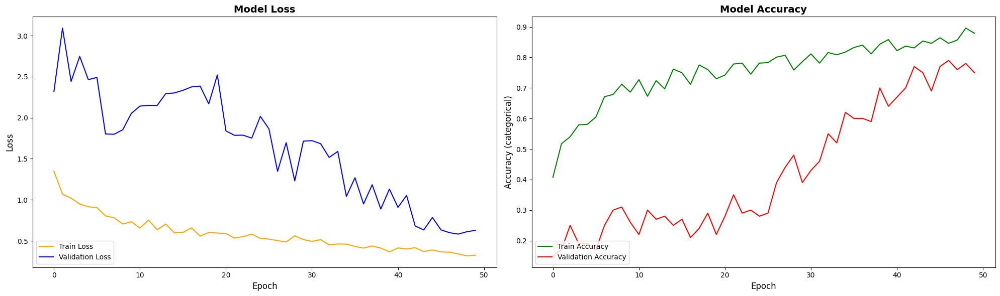

In [53]:
plot_loss_and_accuracy(history7)

## Model with Transfer Learning

Design the network in such a way that the model is able to give good accuracy on the least number of parameters so that it can fit in the memory of the webcam.

### Transfer Learning for Gesture Recognition

Transfer learning is a powerful technique in **deep learning** where a model developed for one task is reused as the starting point for a model on a second task. In the context of **gesture recognition**, transfer learning can drastically reduce the time taken to train models, especially when few labeled data points are available for gestures themselves.

Let’s walk step by step through how transfer learning works in gesture recognition! 🚶

---

### 🎯 **Steps for Gesture Recognition using Transfer Learning:**

1. **Select a Pre-Trained Model**:
   - Pretrained models, like those trained on **ImageNet**, already have learned general features (e.g., edges, texture, and shapes) that can be transferred to your gesture recognition task. 
   - Commonly used models:
     - **ResNet**
     - **MobileNet**
     - **VGGNet**

2. **Load and Fine-Tune the Model**:
   - Start by either **freezing** most of the layers on a pre-trained network or fine-tuning the entire model on a small learning rate (so you don’t forget ImageNet features).
     - This way, the pre-trained model retains its capability of detecting low-level visual features which can be useful for detection of gestures.

3. **Dataset for Gesture**:
   - Collect a dataset of **gestures** (your own or from a pre-existing source like **Jester**, **SBU Kinect Interaction**).
   - Gesture recognition tasks typically involve **temporal data** like videos or sequences of images (frames).

4. **Use Transfer Learning to Fit the Gesture Dataset**:
   - Replace the final **fully connected layer** or the output layer of the pretrained model to fit your specific gesture class outputs. For example, if you have 5 gestures to classify, you’ll change the last layer to have 5 output neurons with `softmax` activation.

5. **Train the Modified Model**:
   - Train the last layer or the final layers using your gesture dataset (with a smaller number of epochs compared to training from scratch).
   - Apply data augmentation like `flipping, rotation`, etc. to artificially increase training data.

6. **Test and Optimize**:
   - After training, test the model on unseen gestures.
   - Fine-tune by selective unfreezing of some early layers if necessary (fine-tuning).

### 🤖 Why Transfer Learning is Beneficial for Gesture Recognition?

1. **Reduces the Need for Large Gesture Data**:
   - Pre-trained models already contain information learned from massive datasets (e.g., ImageNet); hence you don’t need a huge gesture-specific dataset to learn good features.

2. **Saves Time and Computation**:
   - Training a whole **Convolutional Neural Network (CNN)** from scratch will take a lot of time and computational resources. Transfer learning accelerates this process ⏱️.

3. **Generalizable Features**:
   - The features learned in gesture recognition like hand movements can be similar to those learned from other image datasets, so you can adapt these learned features instead of reinventing the wheel.

---

### MobileNet

### What is MobileNet?

**MobileNet** is a family of lightweight, efficient deep learning models designed by Google primarily for use on mobile and embedded devices. These models are specifically optimized for **low-latency** and **low-computational power environments**, such as smartphones and IoT (Internet of Things) devices. Despite being lightweight, MobileNet still performs impressively well on complex tasks like **image classification**, **object detection**, **segmentation**, and more.

---

### 📜 Key Features of MobileNet:

1. **Low Computational Cost**:
   - MobileNet uses techniques such as _depthwise separable convolutions_ that significantly reduce the number of parameters and computational cost compared to traditional convolutional neural networks (CNNs).
   
2. **Performance vs. Efficiency Trade-off**:
   - You can adjust a parameter called **width multiplier** (α) and **resolution multiplier** (ρ) to balance between computational efficiency and accuracy, allowing you to choose a model that fits your resource constraints.
   
3. **Compact Models**:
   - MobileNet is much more compact in terms of model size when compared to traditional deep learning architectures such as VGG or ResNet.

4. **Optimized for Real-time Applications**:
   - Because of its low computation needs, MobileNet is suitable for real-time tasks like live object detection on mobile devices in applications such as real-time AR (Augmented Reality) and autonomous vehicles.

5. **Pre-trained Models**:
   - MobileNet models are pre-trained on large datasets (e.g., **ImageNet** 🖼️), making them easy to fine-tune for custom tasks with very little data.

---

### 🛠️ **How does it work?**

MobileNet is grounded in the concept of **Depthwise Separable Convolutions**, which decompose a standard convolution into two steps:

1. **Depthwise Convolutions**: Performs lightweight filtering by applying a single convolutional filter per input channel.
   
2. **Pointwise Convolutions**: Combines the outputs of depthwise convolutions to create new features using just a 1x1 convolution.



### 🏗️ **MobileNet Variants**:

| **MobileNet Variant**  | **Year** | **Advancement** |
|------------------------|----------|-----------------|
| MobileNetV1 📱         | 2017     | Introduced depthwise separable convolutions.
| MobileNetV2 🚀         | 2018     | Introduced **inverted residuals** and linear bottleneck layers for better accuracy and efficiency.
| MobileNetV3 ⚙️         | 2019     | Used neural architecture search (NAS) to further optimize performance while maintaining size and speed. |

---



#### Importing the transfer learning mobilenet model:

In [54]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import LSTM, Dropout, Dense, Input, Lambda, Flatten
from tensorflow.keras.models import Model
import tensorflow as tf
from tensorflow.keras import regularizers

In [55]:
# 3. Load Pre-trained MobileNetV2 model and Freeze it
mobilenet_transfer_v2 = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# # Important step: **Freeze ALL layers** of MobileNet **before** adding to the model (set as non-trainable)
# mobilenet_transfer.trainable = True


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


### Model 8: Model with Transfer Learning with trainable params using LSTM

In [56]:
input_shape

(10, 120, 120, 3)

In [57]:
# Correct the resizing function to handle time sequences
def resize_images(frames):
    batch_size, time_steps, height, width, channels = frames.shape  # Assuming frames has this shape
    return tf.map_fn(  # map_fn will apply the resizing function to each frame individually
        lambda x: tf.image.resize(x, (224, 224)),
        frames
    )



In [58]:
# Create MobileNetV2 model once and reuse it
mobilenet_v2 = tf.keras.applications.MobileNetV2(
    input_shape=(224, 224, 3), include_top=False,alpha=0.35  # Reduce model size (alpha controls the width multiplier)
)

2019640/2019640 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [59]:
def apply_mobilenet_to_frames(frames, mobilenet_v2):
    """
    Applies the pre-built MobileNetV2 model on each frame.
    """

    def mobilenet_single_frame(frame):
        # Simply apply the passed model to a single frame
        return mobilenet_v2(frame)

    # Apply MobileNetV2 over each frame using map_fn
    return tf.map_fn(mobilenet_single_frame, frames)

In [60]:


# 3. Build the complete model
def build_lstm_based_network():
    # Input shape (10 frames of 120x120 pixels, 3 channels)
    input_sequence = Input(shape=(input_shape))

    # Step 1: Resizing frames to 224x224
    resized_sequence = Lambda(lambda x: resize_images(x),
                              output_shape=(10, 224, 224, 3))(input_sequence)

    # Step 2: Apply MobileNetV2 to each resized frame
    mobilenet_applied_sequence = Lambda(
    lambda x: apply_mobilenet_to_frames(x, mobilenet_v2)
)(resized_sequence)

    # Step 3: Flatten each frame’s output before passing to LSTM
    flattened_sequence = TimeDistributed(Flatten())(mobilenet_applied_sequence)

    
    # Step 4: Process sequence via LSTM with L2 regularization and batch norm
    lstm_output = LSTM(128, return_sequences=False,
                       kernel_regularizer=regularizers.l2(0.01))(flattened_sequence)
    lstm_output = BatchNormalization()(lstm_output)
    
    # Step 5: Final Dense layers with Dropout
    x = Dropout(0.25)(lstm_output)
    x = Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.01))(x)
    x = Dropout(0.25)(x)
    output = Dense(5, activation='softmax')(x)

    # Build the final model
    model = Model(inputs=input_sequence, outputs=output, name="Transfer_Learning_with_LSTM")

    
    return model

In [61]:


# Instantiate the model
model8 = build_lstm_based_network()


# Compile the model
model8.compile(optimizer=optimizers.Adam(learning_rate=0.01), loss='categorical_crossentropy', metrics=['categorical_accuracy'])

# Print the model summary
model8.summary()

Model: "Transfer_Learning_with_LSTM"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_9 (InputLayer)      │ (None, 10, 120, 120,   │             0 │
│                                 │ 3)                     │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lambda (Lambda)                 │ (None, 10, 224, 224,   │             0 │
│                                 │ 3)                     │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lambda_1 (Lambda)               │ (None, 10, 7, 7, 1280) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_15             │ (None, 10, 62720)      │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ (None, 128)            │    32,178,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_25          │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 5)              │           645 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 32,196,357 (122.82 MB)

 Trainable params: 32,196,101 (122.82 MB)

 Non-trainable params: 256 (1.00 KB)

In [62]:
# mobilenet_transfer.trainable = True  # Unfreeze all layers of MobileNet

In [63]:
# # Define the model
# model8 = Sequential(name="Transfer_Learning_trainable_params_with_LSTM")

# # Adding TimeDistributed wrapper for Mobilenet
# model8.add(TimeDistributed(mobilenet_transfer, input_shape=(10, 120, 120, 3)))

# # Additional TimeDistributed layers
# model8.add(TimeDistributed(BatchNormalization()))
# model8.add(TimeDistributed(MaxPooling2D((2, 2))))
# model8.add(TimeDistributed(Flatten()))  # This will flatten each time-distributed output

# # LSTM layer to process across time-steps
# model8.add(LSTM(128, return_sequences=False))  # LSTM will process the flattened output

# # Adding Dropout and Dense layers
# model8.add(Dropout(0.25))
# model8.add(Dense(128, activation='relu'))
# model8.add(Dropout(0.25))

# # Final classification layer (assuming 5 classes)
# model8.add(Dense(5, activation='softmax'))


In [64]:

# model8.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])
# print (model8.summary())

In [65]:
history8 = model8.fit(train_generator, steps_per_epoch=steps_per_epoch, epochs=num_epochs, verbose=1, 
                    callbacks=callbacks_list, validation_data=val_generator, 
                    validation_steps=validation_steps, class_weight=None, initial_epoch=0)

Epoch 1/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - categorical_accuracy: 0.2827 - loss: 93.9646
Epoch 1: val_loss did not improve from 0.31157
17/17 ━━━━━━━━━━━━━━━━━━━━ 61s 2s/step - categorical_accuracy: 0.2830 - loss: 95.4959 - val_categorical_accuracy: 0.2600 - val_loss: 97.5106 - learning_rate: 0.0100
Epoch 2/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - categorical_accuracy: 0.3064 - loss: 75.4362
Epoch 2: val_loss did not improve from 0.31157
17/17 ━━━━━━━━━━━━━━━━━━━━ 32s 2s/step - categorical_accuracy: 0.3081 - loss: 74.5311 - val_categorical_accuracy: 0.2800 - val_loss: 32.8940 - learning_rate: 0.0100
Epoch 3/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - categorical_accuracy: 0.3702 - loss: 29.3842
Epoch 3: val_loss did not improve from 0.31157
17/17 ━━━━━━━━━━━━━━━━━━━━ 32s 2s/step - categorical_accuracy: 0.3690 - loss: 29.2601 - val_categorical_accuracy: 0.3400 - val_loss: 23.4007 - learning_rate: 0.0100
Epoch 4/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - categorical_accuracy: 0.3

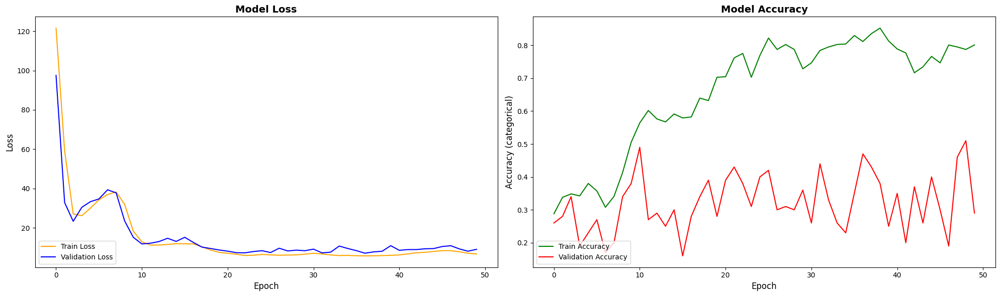

In [66]:
plot_loss_and_accuracy(history8)

### Model 9: Transfer Learning with GRU and training all weights

In [67]:
# 4. Build Model with a trainable GRU layer on top
def build_gru_based_network():
    # Input shape (10 frames of 120x120 pixels, 3 channels)
    input_shape = (10, 120, 120, 3)  # Update this according to your requirements
    input_sequence = Input(shape=(input_shape))
    
    # Step 1: Resizing frames to 224x224
    resized_sequence = Lambda(lambda x: resize_images(x),
                              output_shape=(10, 224, 224, 3))(input_sequence)

    # Step 2: Apply MobileNetV2 to each resized frame
    mobilenet_applied_sequence = Lambda(
        lambda x: apply_mobilenet_to_frames(x, mobilenet_v2)
    )(resized_sequence)

    # Step 3: Flatten each frame’s output before passing to GRU
    flattened_sequence = TimeDistributed(Flatten())(mobilenet_applied_sequence)
    
    # Step 4: Process sequence via GRU with L2 regularization and batch norm
    gru_output = GRU(128, return_sequences=False,
                       kernel_regularizer=regularizers.l2(0.01))(flattened_sequence)
    gru_output = BatchNormalization()(gru_output)

    # Step 5: Final Dense layers with Dropout
    x = Dropout(0.25)(gru_output)
    x = Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.01))(x)
    x = Dropout(0.25)(x)
    output = Dense(5, activation='softmax')(x)

    # Build the final model
    model = Model(inputs=input_sequence, outputs=output, name="Transfer_Learning_with_GRU")
    
    return model


In [68]:
# Instantiate the model with GRU
model9 = build_gru_based_network()

# Compile the model
model9.compile(optimizer=optimizers.Adam(learning_rate=0.01), loss='categorical_crossentropy', metrics=['categorical_accuracy'])

# Print the model summary
model9.summary()

Model: "Transfer_Learning_with_GRU"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_10 (InputLayer)     │ (None, 10, 120, 120,   │             0 │
│                                 │ 3)                     │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lambda_2 (Lambda)               │ (None, 10, 224, 224,   │             0 │
│                                 │ 3)                     │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lambda_3 (Lambda)               │ (None, 10, 7, 7, 1280) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_16             │ (None, 10, 62720)      │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_1 (GRU)                     │ (None, 128)            │    24,134,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_26          │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_11 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_12 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 5)              │           645 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,152,069 (92.13 MB)

 Trainable params: 24,151,813 (92.13 MB)

 Non-trainable params: 256 (1.00 KB)

In [69]:
# mobilenet_transfer.trainable = True  # Unfreeze all layers of MobileNet

In [70]:
# model9 = Sequential(name="Transfer_Learning_with_GRU")
# model9.add(TimeDistributed(mobilenet_transfer,input_shape=(input_shape)))
# for layer in model9.layers:
#     layer.trainable = True

# model9.add(TimeDistributed(BatchNormalization()))
# model9.add(TimeDistributed(MaxPooling2D((2, 2))))
# model9.add(TimeDistributed(Flatten()))

# model9.add(GRU(128))
# model9.add(Dropout(0.25))

# model9.add(Dense(128,activation='relu'))
# model9.add(Dropout(0.25))

# model9.add(Dense(5, activation='softmax'))

In [71]:

# model9.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])
# print (model9.summary())

In [72]:
from tensorflow.keras.mixed_precision import set_global_policy

# Enable Mixed Precision
set_global_policy('mixed_float16')

In [73]:
import tensorflow as tf

tf.keras.backend.clear_session()

In [74]:
history9 = model9.fit(train_generator, steps_per_epoch=steps_per_epoch, epochs=num_epochs, verbose=1, 
                    callbacks=callbacks_list, validation_data=val_generator, 
                    validation_steps=validation_steps, class_weight=None, initial_epoch=0)

Epoch 1/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - categorical_accuracy: 0.2720 - loss: 65.2157
Epoch 1: val_loss did not improve from 0.31157
17/17 ━━━━━━━━━━━━━━━━━━━━ 59s 2s/step - categorical_accuracy: 0.2731 - loss: 66.3968 - val_categorical_accuracy: 0.2600 - val_loss: 78.5691 - learning_rate: 0.0100
Epoch 2/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - categorical_accuracy: 0.3941 - loss: 62.1039
Epoch 2: val_loss did not improve from 0.31157
17/17 ━━━━━━━━━━━━━━━━━━━━ 32s 2s/step - categorical_accuracy: 0.3944 - loss: 61.3855 - val_categorical_accuracy: 0.2400 - val_loss: 27.9120 - learning_rate: 0.0100
Epoch 3/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - categorical_accuracy: 0.3990 - loss: 24.1444
Epoch 3: val_loss did not improve from 0.31157
17/17 ━━━━━━━━━━━━━━━━━━━━ 32s 2s/step - categorical_accuracy: 0.3977 - loss: 24.0138 - val_categorical_accuracy: 0.2300 - val_loss: 18.8756 - learning_rate: 0.0100
Epoch 4/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - categorical_accuracy: 0.3

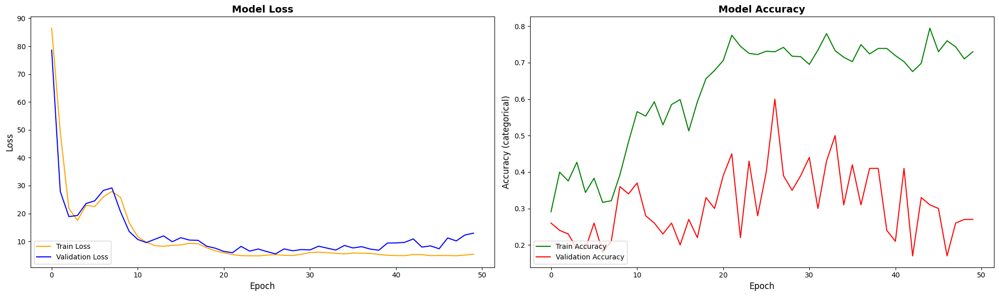

In [75]:
plot_loss_and_accuracy(history9)

In [76]:
# List of Keras history objects from multiple models
histories = [history1, history2, history3, history4, history5, history6,history7, history8, history9]

In [77]:
import pandas as pd

# Collecting data for the table
table_data = []

# Assuming histories is a list of dictionaries (from model.fit()), and all have the same epochs count
num_epochs = len(histories[0].history['loss'])  # Get the number of epochs

# Extracting the epoch-wise loss information for all models
for epoch in range(num_epochs):
    row = [f"Epoch {epoch + 1}"]  # Start the row with epoch number
    for history in histories:
        row.append(f"{history.history['loss'][epoch]:.4f}")       # Training loss
        row.append(f"{history.history['val_loss'][epoch]:.4f}")   # Validation loss
        row.append(f"{history.history['categorical_accuracy'][epoch]:.4f}")   # Validation loss
        row.append(f"{history.history['val_categorical_accuracy'][epoch]:.4f}")   # Validation loss
        row.append(f"{history.history['learning_rate'][epoch]:.4f}")   # Validation loss
    table_data.append(row)

# Prepare headers dynamically based on the number of models used
headers = ['Epoch']
for idx in range(len(histories)):
    headers.extend([f'Model {idx + 1} - Loss', f'Model {idx + 1} - Val Loss',f'Model {idx + 1} - Accuracy', f'Model {idx + 1} - Val Accuracy',f'Model {idx + 1} - Learning Rate'])

# Creating the DataFrame to represent the table
df = pd.DataFrame(table_data, columns=headers)


df


,Epoch,Model 1 - Loss,Model 1 - Val Loss,Model 1 - Accuracy,Model 1 - Val Accuracy,Model 1 - Learning Rate,Model 2 - Loss,Model 2 - Val Loss,Model 2 - Accuracy,Model 2 - Val Accuracy,...,Model 8 - Loss,Model 8 - Val Loss,Model 8 - Accuracy,Model 8 - Val Accuracy,Model 8 - Learning Rate,Model 9 - Loss,Model 9 - Val Loss,Model 9 - Accuracy,Model 9 - Val Accuracy,Model 9 - Learning Rate
0,Epoch 1,7840.7705,1.6279,0.2006,0.1800,0.0100,2.6659,6814.9238,0.3605,0.1900,...,121.5288,97.5106,0.2881,0.2600,0.0100,86.4747,78.5691,0.2911,0.2600,0.0100
1,Epoch 2,1.6170,1.6110,0.1946,0.2200,0.0100,1.4741,991.2877,0.4253,0.2800,...,59.1453,32.8940,0.3379,0.2800,0.0100,49.1724,27.9120,0.3997,0.2400,0.0100
2,Epoch 3,1.6110,1.6079,0.1689,0.2200,0.0100,1.1377,240.5606,0.5566,0.2100,...,27.1497,23.4007,0.3484,0.3400,0.0100,21.7941,18.8756,0.3756,0.2300,0.0100
3,Epoch 4,1.6097,1.6061,0.2036,0.2100,0.0100,1.0692,205.5863,0.5822,0.2300,...,26.2348,30.4915,0.3424,0.1900,0.0100,17.5443,19.2994,0.4268,0.1900,0.0100
4,Epoch 5,1.6099,1.6075,0.1900,0.2300,0.0100,1.1360,90.7212,0.5641,0.2200,...,30.0714,33.3556,0.3801,0.2300,0.0100,22.9642,23.5884,0.3439,0.1900,0.0100
5,Epoch 6,1.6089,1.6058,0.2066,0.2300,0.0100,1.0026,57.3152,0.6290,0.2600,...,34.3002,34.7441,0.3575,0.2700,0.0100,22.4902,24.5364,0.3831,0.2600,0.0100
6,Epoch 7,1.6096,1.6067,0.1855,0.2100,0.0100,0.8838,15.2612,0.6576,0.2600,...,36.9762,39.3993,0.3077,0.1700,0.0100,25.9541,28.2495,0.3167,0.1800,0.0100
7,Epoch 8,1.6093,1.6068,0.1961,0.1800,0.0100,0.8886,14.4513,0.6923,0.2800,...,38.3060,37.8483,0.3409,0.2000,0.0100,27.8934,29.1791,0.3213,0.2100,0.0100
8,Epoch 9,1.6093,1.6070,0.1946,0.2300,0.0100,0.7817,4.3295,0.7391,0.2900,...,31.9330,23.5136,0.4133,0.3400,0.0020,25.7448,20.6002,0.3922,0.3600,0.0020
9,Epoch 10,1.6090,1.6078,0.1991,0.1800,0.0100,0.5504,5.1205,0.7873,0.2300,...,18.3429,15.2714,0.5053,0.3800,0.0020,16.6837,13.5601,0.4827,0.3400,0.0020


In [78]:
import matplotlib.pyplot as plt

def plot_multiple_histories(histories, metric='loss', title='Model Loss Comparison'):
    """
    Compare multiple Keras history objects by visualizing a chosen metric.
    Args:
        histories: List of Keras history objects.
        metric: The metric to plot ('loss', 'accuracy', 'val_loss', 'val_accuracy', ...).
        title: The title of the plot.
    """
    epochs = range(1, len(histories[0].history[metric]) + 1)
    
    plt.figure(figsize=(20, 12))

    # Loop through each history to plot
    for idx, history in enumerate(histories):
        plt.plot(epochs, history.history[metric], label=f'Model {idx + 1} Training {metric.capitalize()}')
        val_metric = 'val_' + metric
        if val_metric in history.history:
            plt.plot(epochs, history.history[val_metric], label=f'Model {idx + 1} Validation {metric.capitalize()}')

    # Add formatting and legends
    plt.title(f'{title}')
    plt.xlabel('Epochs')
    plt.ylabel(metric.capitalize())
    plt.legend()
    plt.show()




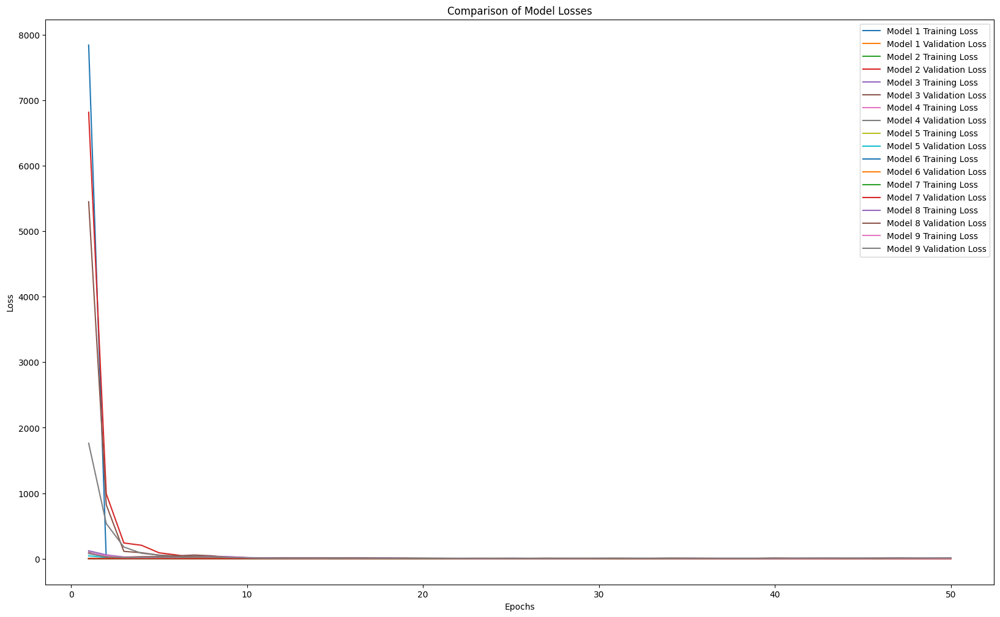

In [79]:
# Example usage
plot_multiple_histories(histories, metric='loss', title='Comparison of Model Losses')

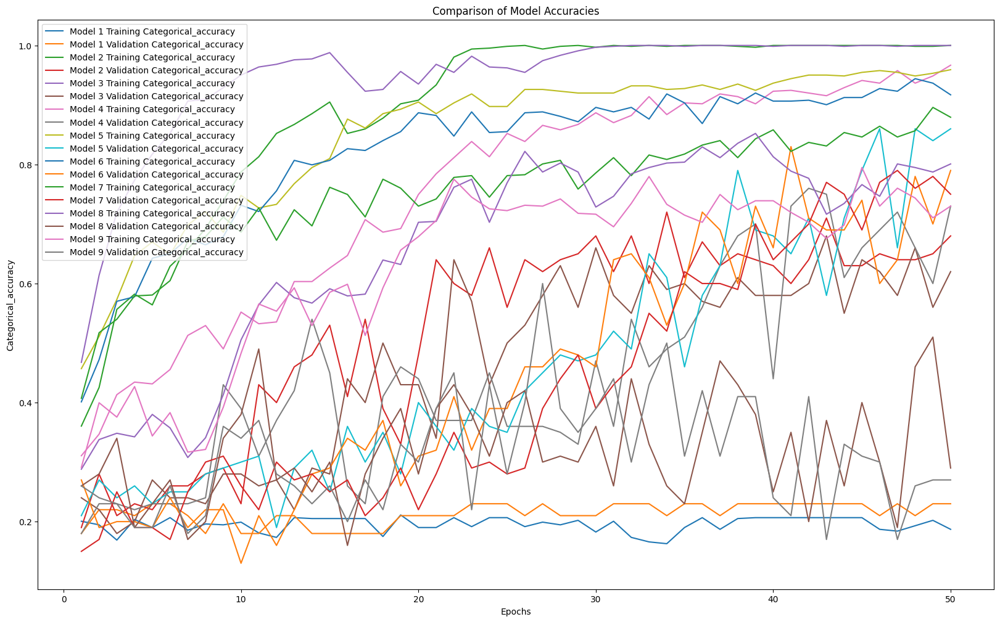

In [80]:
plot_multiple_histories(histories, metric='categorical_accuracy', title='Comparison of Model Accuracies')

In [81]:
import matplotlib.pyplot as plt

# Assuming you have history objects stored in a list
def plot_metric_comparison(histories, metric='loss'):
    """
    Compare the selected metric of multiple models recorded in their history objects.

    Args:
        histories (List[History]): List of Keras history objects.
        metric (str): The metric to compare (e.g. 'loss', 'accuracy', etc.)
    """
    epochs = range(1, len(histories[0].history[metric]) + 1)  # Assuming same length of history

    plt.figure(figsize=(20, 12))

    for idx, history in enumerate(histories):
        plt.plot(epochs, history.history[metric], label=f'Model {idx + 1} Training {metric.capitalize()}')
        val_metric = 'val_' + metric
        if val_metric in history.history:
            plt.plot(epochs, history.history[val_metric], linestyle='--', label=f'Model {idx + 1} Validation {metric.capitalize()}')

    plt.title(f'{metric.capitalize()} Comparison Across Models')
    plt.xlabel('Epochs')
    plt.ylabel(metric.capitalize())
    plt.legend(loc='best')
    plt.grid(True)
    plt.show()



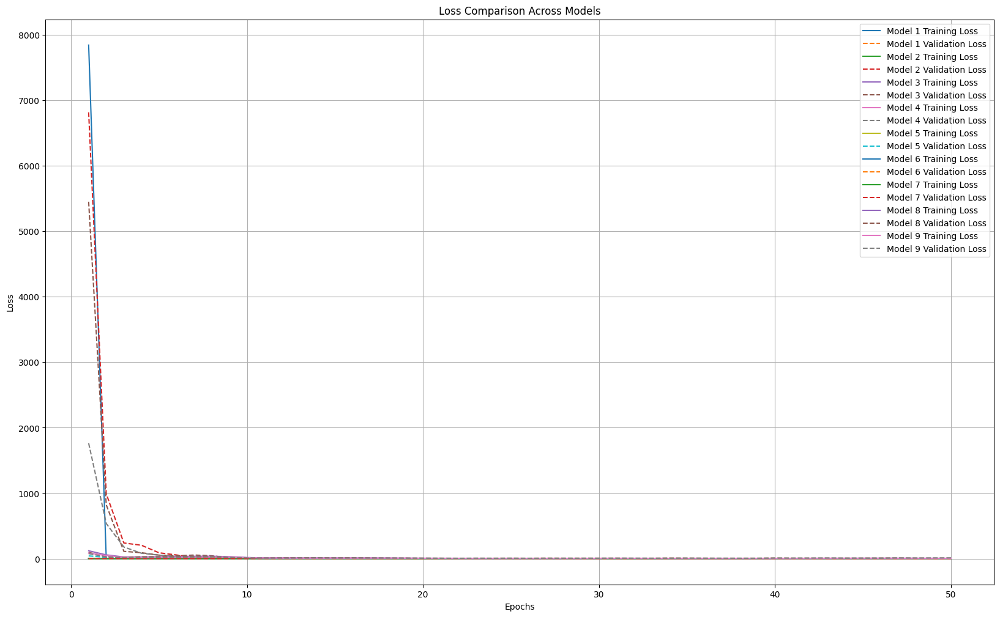

In [82]:
# Optionally obtain different metrics
plot_metric_comparison(histories, metric='loss')


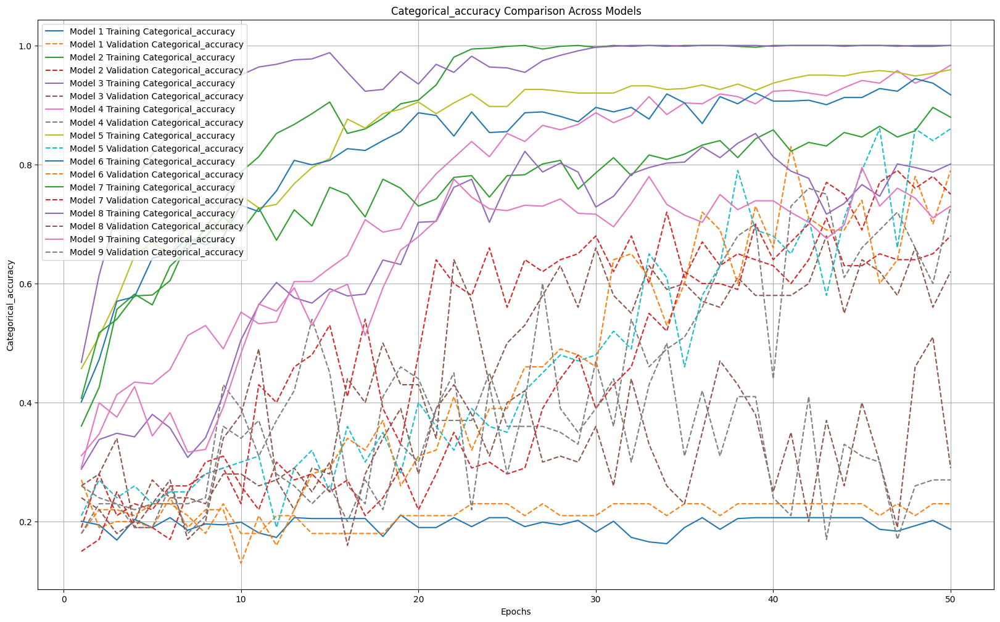

In [83]:
plot_metric_comparison(histories, metric='categorical_accuracy')

In [84]:
# Here's an approach to rank models based on final validation loss.
final_val_losses = [(idx + 1, history.history['val_loss'][-1]) for idx, history in enumerate(histories)]

# Sort based on final validation loss (ascending order)
rankings = sorted(final_val_losses, key=lambda x: x[1])
print("Model rankings based on final validation loss: ")
for rank, (model_num, val_loss) in enumerate(rankings, 1):
    print(f"Rank {rank}: Model {model_num} with validation loss = {val_loss:.4f}")

Model rankings based on final validation loss: 
Rank 1: Model 5 with validation loss = 0.4855
Rank 2: Model 6 with validation loss = 0.5741
Rank 3: Model 7 with validation loss = 0.6279
Rank 4: Model 4 with validation loss = 0.8379
Rank 5: Model 2 with validation loss = 1.4995
Rank 6: Model 1 with validation loss = 1.6068
Rank 7: Model 3 with validation loss = 2.2684
Rank 8: Model 8 with validation loss = 9.1494
Rank 9: Model 9 with validation loss = 12.9480


In [85]:
# Approach to rank models based on final validation accuracy.
final_val_accuracies = [(idx + 1, history.history['val_categorical_accuracy'][-1]) for idx, history in enumerate(histories)]

# Sort based on final validation accuracy (descending order for better accuracy)
rankings = sorted(final_val_accuracies, key=lambda x: x[1], reverse=True)

# Print model rankings by accuracy
print("Model rankings based on final validation accuracy: ")
for rank, (model_num, val_accuracy) in enumerate(rankings, 1):
    print(f"Rank {rank}: Model {model_num} with validation accuracy = {val_accuracy:.4f}")

Model rankings based on final validation accuracy: 
Rank 1: Model 5 with validation accuracy = 0.8600
Rank 2: Model 6 with validation accuracy = 0.7900
Rank 3: Model 7 with validation accuracy = 0.7500
Rank 4: Model 4 with validation accuracy = 0.7300
Rank 5: Model 2 with validation accuracy = 0.6800
Rank 6: Model 3 with validation accuracy = 0.6200
Rank 7: Model 8 with validation accuracy = 0.2900
Rank 8: Model 9 with validation accuracy = 0.2700
Rank 9: Model 1 with validation accuracy = 0.2300


In [86]:
# Function to extract model details.
def get_model_summary(model):
    total_params = model.count_params()
    return {
        "Model": model.name or "Model_" + str(id(model)), # Naming convention if not set
        "Total Parameters": model.count_params(),
        "Trainable Parameters": sum([tf.keras.backend.count_params(w) for w in model.trainable_weights]),
        "Non-Trainable Parameters": sum([tf.keras.backend.count_params(w) for w in model.non_trainable_weights]),
#         "Input Shape": model.layers[0].input_shape[1:],  # First layer's input shape, without the batch size
#         "Output Shape": model.layers[-1].output_shape[1:], # Last layer's output shape, without the batch size
        "Number of Layers": len(model.layers),
        "Model Size (MB)": round(calculate_model_size(total_params), 2)  # Rounded to 2 decimal places
    }

# Helper function to calculate model size in MB
def calculate_model_size(num_params):
    bytes_per_param = 4  # 32-bit floating point (4 bytes per parameter)
    total_size_in_bytes = num_params * bytes_per_param
    total_size_in_mb = total_size_in_bytes / (1024 * 1024)  # Convert from bytes to MB
    return total_size_in_mb

# List of models
models = [model1, model2, model3,model4, model5, model6, model7, model8, model9]

# Gather the summary for each model
data = [get_model_summary(m) for m in models]

# Create a DataFrame to store results in table format
df = pd.DataFrame(data)

df

,Model,Total Parameters,Trainable Parameters,Non-Trainable Parameters,Number of Layers,Model Size (MB)
0,Conv3D_MaxPooling3D,8311813,8311813,0,13,31.71
1,Conv3D_BatchNormalization_MaxPooling3D,8317701,8314757,2944,18,31.73
2,Conv3D_BatchNormalization_Dropouts_MaxPooling3D,22732549,22730629,1920,17,86.72
3,Conv3D_BatchNormalization_Dropouts_GlobalAvera...,712453,710533,1920,17,2.72
4,TimeDistributed_Conv2D_Dense,129477,128517,960,13,0.49
5,TimeDistributed_Conv2D_GRU,99845,99269,576,15,0.38
6,TimeDistributed_ConvLSTM2D,13781,13589,192,11,0.05
7,Transfer_Learning_with_LSTM,32196357,32196101,256,10,122.82
8,Transfer_Learning_with_GRU,24152069,24151813,256,10,92.13
